In [1]:
import pandas as pd

# Load dataset
df = pd.read_csv("../data/carbon_emission_dataset.csv")   # change to your actual file path

# Define crop emission factors
crop_factor = {"Wheat": 0.02, "Rice": 0.03, "Maize": 0.015, "Pulses": 0.01}

# Soil factor function based on pH & moisture
def soil_factor(ph, moisture):
    if ph < 6:
        return 18
    elif 6 <= ph <= 7.5:
        return 12
    else:
        return 20

# Calculate Carbon Emission
df["Carbon_Emission"] = (
    df["Fertilizer_Usage_kg"] * 1.2 +
    df["Pesticide_Usage_kg"] * 0.8 +
    df["Rainfall_mm"] * df["Crop_Type"].map(crop_factor).fillna(0.01) +
    df.apply(lambda row: soil_factor(row["Soil_pH"], row["Soil_Moisture"]), axis=1)
)

# Suggest Control Measures based on emission level
def control_measures(emission):
    if emission < 50:
        return "Sustainable – Maintain practices"
    elif 50 <= emission < 100:
        return "Moderate – Optimize fertilizer & irrigation"
    else:
        return "High – Reduce chemical usage, adopt organic methods"

df["Control_Measures"] = df["Carbon_Emission"].apply(control_measures)

# Save new dataset
df.to_csv("carbon_emission_dataset.csv", index=False)

# Show first few rows
print(df.head())

   Farm_ID   Soil_pH  Soil_Moisture  Temperature_C  Rainfall_mm Crop_Type  \
0        1  7.073643      49.145359      26.668157   227.890912     Wheat   
1        2  6.236931      21.496115      29.325342   244.017493   Soybean   
2        3  5.922335      19.469042      17.666414   141.110521      Corn   
3        4  6.845120      27.974234      17.188722   156.785663     Wheat   
4        5  6.934171      33.637679      23.603899    77.859362      Corn   

   Fertilizer_Usage_kg  Pesticide_Usage_kg  Crop_Yield_ton  \
0           131.692844            2.958215        1.576920   
1           136.370492           19.204770        3.824686   
2            99.725210           11.041066        1.133198   
3           194.832396            8.806271        8.870540   
4            57.271267            3.747553        8.779317   

   Sustainability_Score  Carbon_Emission  \
0             51.913649       176.955803   
1             47.159077       193.448581   
2             50.148418       14

In [3]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Farm_ID               10000 non-null  int64  
 1   Soil_pH               10000 non-null  float64
 2   Soil_Moisture         10000 non-null  float64
 3   Temperature_C         10000 non-null  float64
 4   Rainfall_mm           10000 non-null  float64
 5   Crop_Type             10000 non-null  object 
 6   Fertilizer_Usage_kg   10000 non-null  float64
 7   Pesticide_Usage_kg    10000 non-null  float64
 8   Crop_Yield_ton        10000 non-null  float64
 9   Sustainability_Score  10000 non-null  float64
 10  Carbon_Emission       10000 non-null  float64
 11  Control_Measures      10000 non-null  object 
dtypes: float64(9), int64(1), object(2)
memory usage: 937.6+ KB


In [5]:
df.describe()


,Farm_ID,Soil_pH,Soil_Moisture,Temperature_C,Rainfall_mm,Fertilizer_Usage_kg,Pesticide_Usage_kg,Crop_Yield_ton,Sustainability_Score,Carbon_Emission
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5000.50000,6.499494,29.988655,25.027475,174.969854,125.212701,10.521074,5.489634,50.213200,175.213456
std,2886.89568,0.574181,11.493376,5.769509,72.860989,43.132645,5.535558,2.608809,28.667146,52.082888
min,1.00000,5.500021,10.002907,15.000186,50.031967,50.007543,1.001370,1.000323,0.003672,74.981212
25%,2500.75000,6.003992,20.027802,20.078612,111.786631,87.945625,5.675684,3.218402,25.974568,130.227208
50%,5000.50000,6.495380,29.862527,24.955117,174.468002,125.188012,10.619785,5.490626,50.234210,175.281013
75%,7500.25000,6.993481,40.052369,30.053313,237.812507,162.619398,15.330758,7.740585,74.938267,219.875320
max,10000.00000,7.499762,49.994713,34.999673,299.986192,199.991631,19.999099,9.999638,99.994545,278.416570


(10000, 12)
   Farm_ID   Soil_pH  Soil_Moisture  Temperature_C  Rainfall_mm Crop_Type  \
0        1  7.073643      49.145359      26.668157   227.890912     Wheat   
1        2  6.236931      21.496115      29.325342   244.017493   Soybean   
2        3  5.922335      19.469042      17.666414   141.110521      Corn   
3        4  6.845120      27.974234      17.188722   156.785663     Wheat   
4        5  6.934171      33.637679      23.603899    77.859362      Corn   

   Fertilizer_Usage_kg  Pesticide_Usage_kg  Crop_Yield_ton  \
0           131.692844            2.958215        1.576920   
1           136.370492           19.204770        3.824686   
2            99.725210           11.041066        1.133198   
3           194.832396            8.806271        8.870540   
4            57.271267            3.747553        8.779317   

   Sustainability_Score  Carbon_Emission  \
0             51.913649       176.955803   
1             47.159077       193.448581   
2             50.148

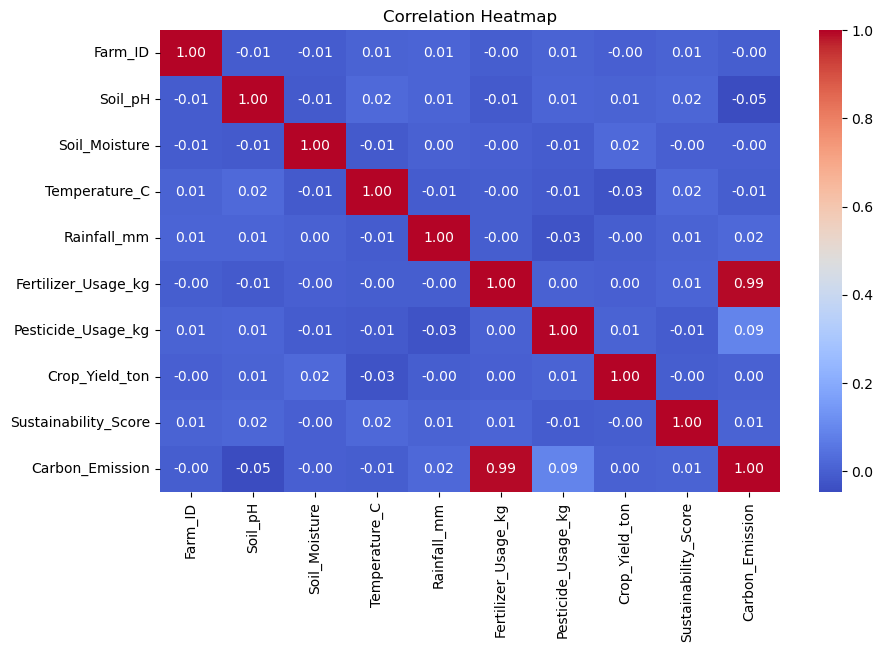

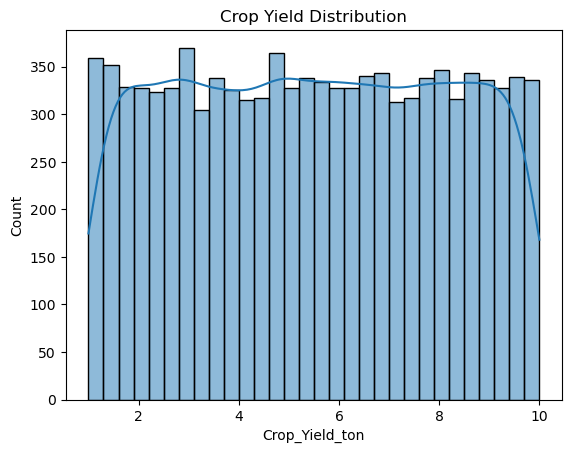

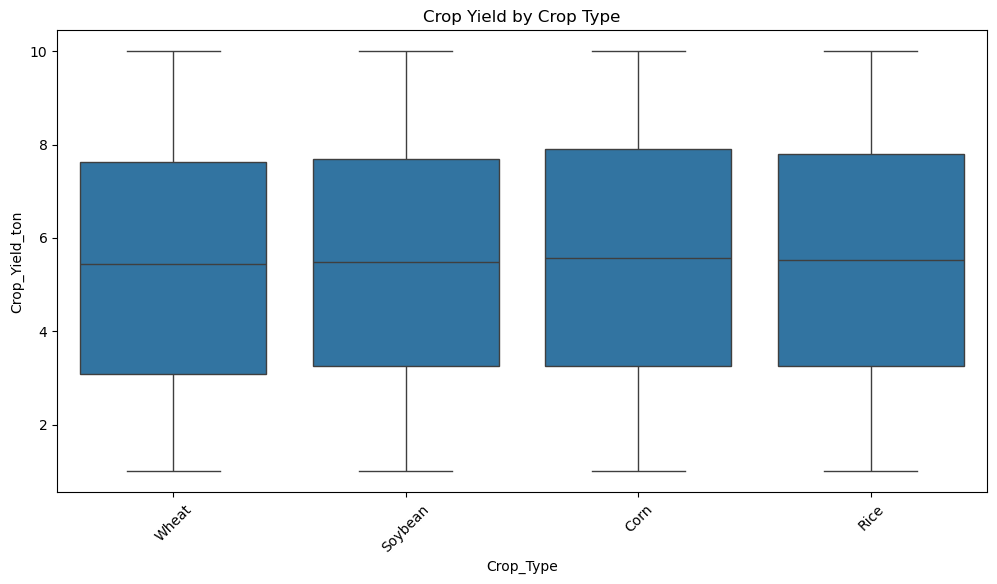

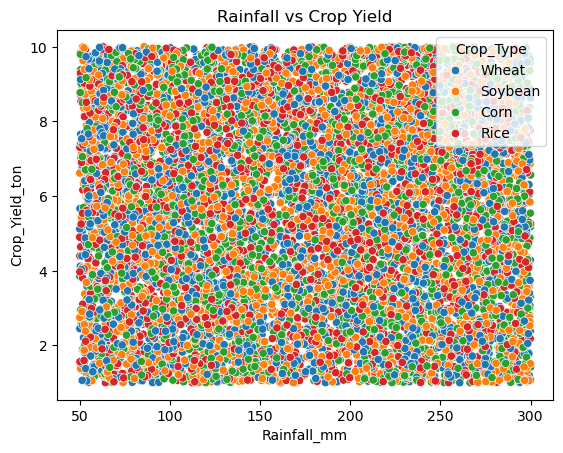

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
df = pd.read_csv("../data/carbon_emission_dataset.csv")

# Quick look
print(df.shape)
print(df.head())
print(df.info())
print(df.describe())

# Missing values check
print(df.isnull().sum())

# Class distribution (Crop types)
print(df['Crop_Type'].value_counts())

# Correlation heatmap
# Correlation heatmap (only numeric columns)
plt.figure(figsize=(10,6))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()


# Distribution of Crop Yield
sns.histplot(df['Crop_Yield_ton'], kde=True, bins=30)
plt.title("Crop Yield Distribution")
plt.show()

# Boxplot of yield per crop
plt.figure(figsize=(12,6))
sns.boxplot(x='Crop_Type', y='Crop_Yield_ton', data=df)

plt.xticks(rotation=45)
plt.title("Crop Yield by Crop Type")
plt.show()

# Scatter: Rainfall vs Yield
sns.scatterplot(x="Rainfall_mm", y="Crop_Yield_ton", hue="Crop_Type", data=df)
plt.title("Rainfall vs Crop Yield")
plt.show()


In [8]:
df.columns

Index(['Farm_ID', 'Soil_pH', 'Soil_Moisture', 'Temperature_C', 'Rainfall_mm',
       'Crop_Type', 'Fertilizer_Usage_kg', 'Pesticide_Usage_kg',
       'Crop_Yield_ton', 'Sustainability_Score', 'Carbon_Emission',
       'Control_Measures'],
      dtype='object')

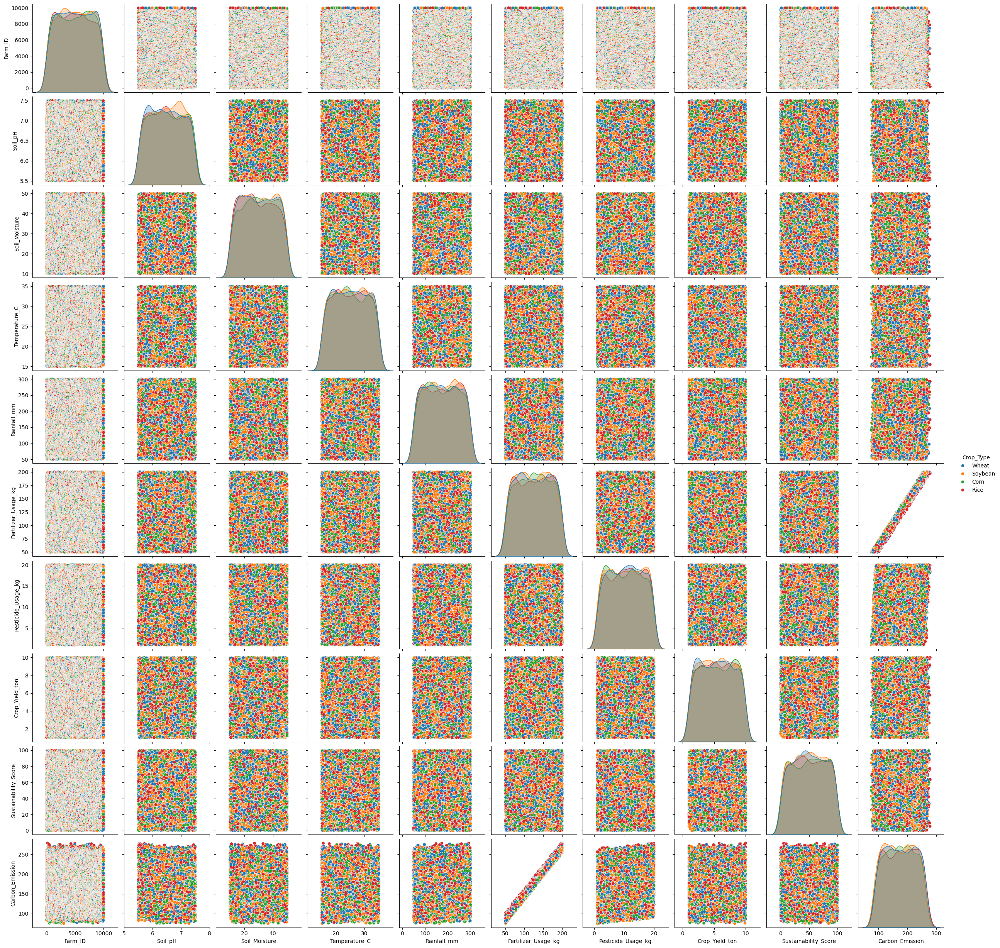

In [11]:
sns.pairplot(df, hue="Crop_Type")
plt.show()

In [14]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Load dataset (updated one with Carbon_Emission)
df = pd.read_csv("carbon_emission_dataset.csv")

# Features & Target
X = df[['Soil_pH', 'Soil_Moisture', 'Temperature_C', 'Rainfall_mm',
        'Crop_Type', 'Fertilizer_Usage_kg', 'Pesticide_Usage_kg', 'Crop_Yield_ton']]
y = df['Carbon_Emission']

# Categorical column
categorical_features = ['Crop_Type']

# Preprocessor: OneHotEncode Crop_Type
preprocessor = ColumnTransformer(
    transformers=[('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)],
    remainder='passthrough'
)

# Model pipeline
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train model
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)

# Evaluation
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("Model Performance:")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R²: {r2:.2f}")


Model Performance:
MAE: 1.53
MSE: 3.25
RMSE: 1.80
R²: 1.00


In [17]:
import joblib
joblib.dump(model, "carbon_emission_model.pkl")
joblib.dump(X.columns, "X_columns.pkl")


['X_columns.pkl']

In [19]:
print(X.columns)


Index(['Soil_pH', 'Soil_Moisture', 'Temperature_C', 'Rainfall_mm', 'Crop_Type',
       'Fertilizer_Usage_kg', 'Pesticide_Usage_kg', 'Crop_Yield_ton'],
      dtype='object')
